In [1]:
!pip install -q 'tensorflow-text==2.15.*'
!pip index versions tensorflow-text

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
s3fs 2024.9.0 requires fsspec==2024.9.0.*, but you have fsspec 2024.6.0 which is incompatible.
tensorflow-decision-forests 1.9.1 requires tensorflow~=2.16.1, but you have tensorflow 2.15.1 which is incompatible.
tensorflow-decision-forests 1.9.1 requires tf-keras~=2.16, but you have tf-keras 2.15.1 which is incompatible.
tensorflow-serving-api 2.16.1 requires tensorflow<3,>=2.16.1, but you have tensorflow 2.15.1 which is incompatible.
tensorflow-text (2.18.0)
Available versions: 2.18.0, 2.17.0, 2.16.1, 2.15.0, 2.14.0, 2.13.0, 2.12.1, 2.12.0, 2.11.0, 2.10.0, 2.9.0, 2.8.2, 2.8.1
  INSTALLED: 2.15.0
  LATEST:    2.18.0


In [2]:
import string
import numpy as np
import pandas as pd
from numpy import array
from pickle import load

from PIL import Image
import pickle
from collections import Counter
import matplotlib.pyplot as plt

import sys, time, os, warnings
warnings.filterwarnings("ignore")
import re

import keras
import tensorflow as tf
from tqdm import tqdm
from nltk.translate.bleu_score import sentence_bleu

from keras.utils import pad_sequences
from keras.utils import load_img
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers import add
from keras.callbacks import ModelCheckpoint
from keras.utils import img_to_array
#from keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.applications.convnext import ConvNeXtTiny, preprocess_input


from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

2024-12-13 09:44:33.408639: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-13 09:44:33.408716: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-13 09:44:33.410377: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
image_path = "/kaggle/input/flickr8k/Images"
data = pd.read_csv("/kaggle/input/flickr8k-nepali-captions-csv/translated_nepali_captions.csv")
jpgs = os.listdir(image_path)
print("Total Images in Dataset = {}".format(len(jpgs)))
print(type(data))
data

Total Images in Dataset = 8091
<class 'pandas.core.frame.DataFrame'>


,caption_id,nepali_caption
0,1000268201_693b08cb0e.jpg#0,गुलाबी लुगा लगाएको बच्चा प्रवेश गर्ने बाटोमा स...
1,1000268201_693b08cb0e.jpg#1,काठको भवनमा जाँदै केटी।
2,1000268201_693b08cb0e.jpg#2,एउटा सानो केटी काठको प्लेहाउसमा चढ्दै।
3,1000268201_693b08cb0e.jpg#3,एउटी सानी केटी आफ्नो खेलघरमा सिँढी चढ्दै।
4,1000268201_693b08cb0e.jpg#4,गुलाबी पोशाक लगाएकी एउटी सानी केटी काठको केबिन...
...,...,...
40450,997722733_0cb5439472.jpg#0,गुलाबी शर्ट लगाएको मान्छे चट्टानको अनुहारमा चढ...
40451,997722733_0cb5439472.jpg#1,एउटा मानिस हावामा उचाइमा चट्टान चढिरहेको छ।
40452,997722733_0cb5439472.jpg#2,रातो शर्ट लगाएको एक व्यक्ति असिस्ट ह्यान्डलले ...
40453,997722733_0cb5439472.jpg#3,रातो शर्ट लगाएको चट्टान आरोही।


In [4]:
data['caption_id'] = data['caption_id'].str.split('#').str[0]
# Or, if you want to keep the rename:
data.rename(columns = {'caption_id':'filename','nepali_caption':'caption'}, inplace = True)
uni_filenames = np.unique(data.filename.values)
data.head()

,filename,caption
0,1000268201_693b08cb0e.jpg,गुलाबी लुगा लगाएको बच्चा प्रवेश गर्ने बाटोमा स...
1,1000268201_693b08cb0e.jpg,काठको भवनमा जाँदै केटी।
2,1000268201_693b08cb0e.jpg,एउटा सानो केटी काठको प्लेहाउसमा चढ्दै।
3,1000268201_693b08cb0e.jpg,एउटी सानी केटी आफ्नो खेलघरमा सिँढी चढ्दै।
4,1000268201_693b08cb0e.jpg,गुलाबी पोशाक लगाएकी एउटी सानी केटी काठको केबिन...


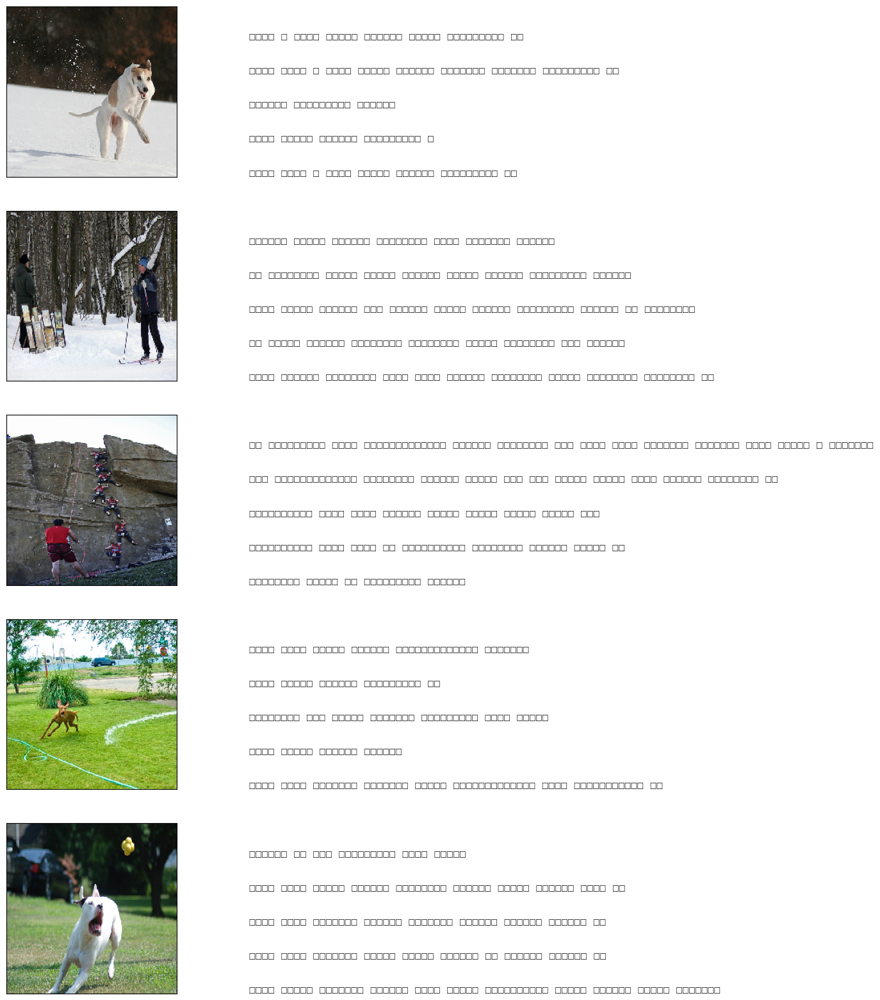

In [5]:
from matplotlib import font_manager
bangla_font_path = "/kaggle/input/nepali-ttf/Nepali.TTF"  # Provide the path to your installed Bangla font
bangla_font_prop = font_manager.FontProperties(fname=bangla_font_path)
npic = 5
npix = 224
target_size = (npix,npix,3)
count = 1

fig = plt.figure(figsize=(10,20))
for jpgfnm in uni_filenames[10:15]:
    filename = image_path + '/' + jpgfnm
    captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
    image_load = load_img(filename, target_size=target_size)
    ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
    ax.imshow(image_load)
    count += 1

    ax = fig.add_subplot(npic,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions))
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontproperties=bangla_font_prop)
    count += 1
plt.show()

In [6]:
uni_filenames = np.unique(data.filename.values)
data.head()

,filename,caption
0,1000268201_693b08cb0e.jpg,गुलाबी लुगा लगाएको बच्चा प्रवेश गर्ने बाटोमा स...
1,1000268201_693b08cb0e.jpg,काठको भवनमा जाँदै केटी।
2,1000268201_693b08cb0e.jpg,एउटा सानो केटी काठको प्लेहाउसमा चढ्दै।
3,1000268201_693b08cb0e.jpg,एउटी सानी केटी आफ्नो खेलघरमा सिँढी चढ्दै।
4,1000268201_693b08cb0e.jpg,गुलाबी पोशाक लगाएकी एउटी सानी केटी काठको केबिन...


In [7]:
vocabulary = []
for txt in data.caption.values:
    vocabulary.extend(txt.split())
print('Vocabulary Size: %d' % len(set(vocabulary)))
print(len(vocabulary))

Vocabulary Size: 15991
334366


In [8]:
for i in vocabulary:
    if len(i)<2:
        vocabulary.remove(i)
vocabulary=set(vocabulary)
print(len(vocabulary))

15963


In [9]:
PATH = "/kaggle/working/images/"
all_captions = []
for caption  in data['caption']:
    caption = '<start> ' + caption+ ' <end>'
    all_captions.append(caption)

all_captions[:10]
if not os.path.exists(PATH):
    os.makedirs(PATH)

In [10]:
import shutil

all_img_name_vector = []
for annot in data["filename"]:
    filename = annot
    source_path = '/kaggle/input/flickr8k/Images/' + filename
    destination_path = '/kaggle/working/images/' + filename
    shutil.copyfile(source_path, destination_path)
    
    full_image_path = PATH + annot
    all_img_name_vector.append(full_image_path)
    
all_img_name_vector[:10]

['/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg']

In [11]:
print(f"len(all_img_name_vector) : {len(all_img_name_vector)}")
print(f"len(all_captions) : {len(all_captions)}")

len(all_img_name_vector) : 40455
len(all_captions) : 40455


In [12]:
def data_limiter(num,total_captions,all_img_name_vector):
    train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
    train_captions = train_captions[:num]
    img_name_vector = img_name_vector[:num]
    return train_captions,img_name_vector

train_captions,img_name_vector = data_limiter(40000,all_captions,all_img_name_vector)

In [13]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))  # ConvNeXt typically uses 224x224 input size
    img = preprocess_input(img)  # Use preprocess_input from ConvNeXt
    return img, image_path

# Load the ConvNeXt-Tiny model
image_model = ConvNeXtTiny(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

111650432/111650432 [==============================] - 5s 0us/step


In [14]:
encode_train = sorted(set(img_name_vector))
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)

In [15]:
%%time
for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                             (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        np.save(path_of_feature, bf.numpy())

  0%|          | 0/127 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1734083257.995649      23 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
100%|██████████| 127/127 [00:42<00:00,  2.99it/s]

CPU times: user 1min 7s, sys: 2.74 s, total: 1min 10s
Wall time: 42.5 s


In [16]:
top_k = 12000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\\]^_`{|}~\t\n')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'
max_length=25
train_seqs = tokenizer.texts_to_sequences(train_captions)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post',maxlen=max_length)
#Let’s visualize the padded training and captions and the tokenized vectors:

train_captions[:3]
print(cap_vector[0])
print(len(cap_vector[0]))

[   2   77   92  336 1321  758 1086    3    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0]
25


In [17]:
train_seqs[:3]

[[2, 77, 92, 336, 1321, 758, 1086, 3],
 [2, 1406, 1718, 793, 508, 4880, 462, 429, 50, 191, 123, 3],
 [2, 4, 13, 8, 121, 452, 146, 30, 5, 3]]

In [18]:
def calc_max_length(tensor):
    return max(len(t) for t in tensor)
max_length = calc_max_length(train_seqs)
max_length=25
def calc_min_length(tensor):
    return min(len(t) for t in tensor)
min_length = calc_min_length(train_seqs)

print('Max Length of any caption : Min Length of any caption = '+ str(max_length) +" : "+str(min_length))

Max Length of any caption : Min Length of any caption = 25 : 3


In [19]:
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,cap_vector, test_size=0.02, random_state=0)

In [20]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
num_steps = len(img_name_train) // BATCH_SIZE

def map_func(img_name, cap):
    img_tensor = np.load(img_name.decode('utf-8')+'.npy')
    return img_tensor, cap

dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [21]:
#num_steps = len(img_name_val) // BATCH_SIZE
val_dataset = tf.data.Dataset.from_tensor_slices((img_name_val, cap_val))
val_dataset = val_dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]), num_parallel_calls=tf.data.experimental.AUTOTUNE)
val_dataset = val_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [22]:
def get_angles(pos, i, d_model):
    angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
    return pos * angle_rates

def positional_encoding_1d(position, d_model):
    angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                           np.arange(d_model)[np.newaxis, :],
                           d_model)

    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
    pos_encoding = angle_rads[np.newaxis, ...]
    return tf.cast(pos_encoding, dtype=tf.float32)

def positional_encoding_2d(row,col,d_model):
    assert d_model % 2 == 0
    row_pos = np.repeat(np.arange(row),col)[:,np.newaxis]
    col_pos = np.repeat(np.expand_dims(np.arange(col),0),row,axis=0).reshape(-1,1)

    angle_rads_row = get_angles(row_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
    angle_rads_col = get_angles(col_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)

    angle_rads_row[:, 0::2] = np.sin(angle_rads_row[:, 0::2])
    angle_rads_row[:, 1::2] = np.cos(angle_rads_row[:, 1::2])
    angle_rads_col[:, 0::2] = np.sin(angle_rads_col[:, 0::2])
    angle_rads_col[:, 1::2] = np.cos(angle_rads_col[:, 1::2])
    pos_encoding = np.concatenate([angle_rads_row,angle_rads_col],axis=1)[np.newaxis, ...]
    return tf.cast(pos_encoding, dtype=tf.float32)

In [23]:
def create_padding_mask(seq):
    seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
    return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

def create_look_ahead_mask(size):
    mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
    return mask  # (seq_len, seq_len)

def scaled_dot_product_attention(q, k, v, mask):
    matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)
    dk = tf.cast(tf.shape(k)[-1], tf.float32)
    scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)
    if mask is not None:
        scaled_attention_logits += (mask * -1e9) 
    attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1) 
    output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)
#     print(output.shape)
#     image =array_to_img(output)
#     image.show()
    return output, attention_weights

class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model
        assert d_model % self.num_heads == 0
        self.depth = d_model // self.num_heads
        self.wq = tf.keras.layers.Dense(d_model)
        self.wk = tf.keras.layers.Dense(d_model)
        self.wv = tf.keras.layers.Dense(d_model)
        self.dense = tf.keras.layers.Dense(d_model)

    def split_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, v, k, q, mask=None):
        batch_size = tf.shape(q)[0]
        q = self.wq(q)  # (batch_size, seq_len, d_model)
        k = self.wk(k)  # (batch_size, seq_len, d_model)
        v = self.wv(v)  # (batch_size, seq_len, d_model)

        q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
        k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
        v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)

        scaled_attention, attention_weights = scaled_dot_product_attention(q, k, v, mask)
        scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q,      num_heads, depth)

        concat_attention = tf.reshape(scaled_attention,(batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

        output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)
        return output, attention_weights

def point_wise_feed_forward_network(d_model, dff):
    return tf.keras.Sequential([
                tf.keras.layers.Dense(dff, activation='relu'),tf.keras.layers.Dense(d_model)])# (batch_size, seq_len, d_model)])

In [24]:
class EncoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.001):
        super(EncoderLayer, self).__init__()
        self.mha = MultiHeadAttention(d_model, num_heads)
        self.ffn = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)


    def call(self, x, training, mask=None):
        attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)

        ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
        ffn_output = self.dropout2(ffn_output, training=training)
        out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)
        return out2
class DecoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.001):
        super(DecoderLayer, self).__init__()
        self.mha1 = MultiHeadAttention(d_model, num_heads)
        self.mha2 = MultiHeadAttention(d_model, num_heads)

        self.ffn = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)
        self.dropout3 = tf.keras.layers.Dropout(rate)

    def call(self, x, enc_output, training,look_ahead_mask=None, padding_mask=None):
        attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
        attn1 = self.dropout1(attn1, training=training)
        out1 = self.layernorm1(attn1 + x)

        attn2, attn_weights_block2 = self.mha2(enc_output, enc_output, out1, padding_mask) 
        attn2 = self.dropout2(attn2, training=training)
        out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)

        ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
        ffn_output = self.dropout3(ffn_output, training=training)
        out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)
        return out3, attn_weights_block1, attn_weights_block2

In [25]:
class Encoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, row_size,col_size,rate=0.001):
        super(Encoder, self).__init__()
        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = tf.keras.layers.Dense(self.d_model,activation='relu')
        self.pos_encoding = positional_encoding_2d(row_size,col_size,self.d_model)

        self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate) for _ in range(num_layers)]
        self.dropout = tf.keras.layers.Dropout(rate)

    def call(self, x, training, mask=None):
        seq_len = tf.shape(x)[1]
        x = self.embedding(x)  # (batch_size, input_seq_len(H*W), d_model)
        x += self.pos_encoding[:, :seq_len, :]
        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x = self.enc_layers[i](x, training, mask)

        return x  # (batch_size, input_seq_len, d_model)
class Decoder(tf.keras.layers.Layer):
    def __init__(self, num_layers,d_model,num_heads,dff, target_vocab_size, maximum_position_encoding,   rate=0.001):
        super(Decoder, self).__init__()
        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
        self.pos_encoding = positional_encoding_1d(maximum_position_encoding, d_model)

        self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate)
                         for _ in range(num_layers)]
        self.dropout = tf.keras.layers.Dropout(rate)

    def call(self, x, enc_output, training,look_ahead_mask=None, padding_mask=None):
        seq_len = tf.shape(x)[1]
        attention_weights = {}

        x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x += self.pos_encoding[:, :seq_len, :]
        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                            look_ahead_mask, padding_mask)
         
            attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
            attention_weights['decoder_layer{}_block2'.format(i+1)] = block2
        return x, attention_weights

In [26]:
import time

In [27]:
class Transformer(tf.keras.Model):
    def __init__(self, num_layers, d_model, num_heads, dff,row_size,col_size,
              target_vocab_size,max_pos_encoding, rate=0.001):
        super(Transformer, self).__init__()
        self.encoder = Encoder(num_layers, d_model, num_heads, dff,row_size,col_size, rate)
        self.decoder = Decoder(num_layers, d_model, num_heads, dff,target_vocab_size,max_pos_encoding, rate)
        self.final_layer = tf.keras.layers.Dense(target_vocab_size)

    def call(self, inp, tar, training,look_ahead_mask=None,dec_padding_mask=None,enc_padding_mask=None   ):
        enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model      )
        dec_output, attention_weights = self.decoder(tar, enc_output, training, look_ahead_mask, dec_padding_mask)
        final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)
        return final_output, attention_weights

In [28]:
num_layer = 8
d_model = 512
dff = 2048
num_heads = 8
row_size = 8
col_size = 8
target_vocab_size = top_k + 1
dropout_rate = 0.001
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, d_model, warmup_steps=4000):
        super(CustomSchedule, self).__init__()
        self.d_model = d_model
        self.d_model = tf.cast(self.d_model, tf.float32)
        self.warmup_steps = warmup_steps
    def __call__(self, step):
        step = tf.cast(step, tf.float32)  
        arg1 = tf.math.rsqrt(step)
        arg2 = step * (self.warmup_steps ** -1.5)
        #print(tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2))
        return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)
learning_rate = CustomSchedule(d_model)
optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98,
                                    epsilon=1e-9)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    return tf.reduce_sum(loss_)/tf.reduce_sum(mask)
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')

val_loss = tf.keras.metrics.Mean(name='val_loss')
val_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='val_accuracy')

transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

In [29]:
def create_masks_decoder(tar):
    look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
    dec_target_padding_mask = create_padding_mask(tar)
    combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
    return combined_mask
@tf.function
def train_step(img_tensor, tar):
    tar_inp = tar[:, :-1]
    tar_real = tar[:, 1:]
    dec_mask = create_masks_decoder(tar_inp)
    with tf.GradientTape() as tape:
        predictions, _ = transformer(img_tensor, tar_inp,True, dec_mask)
        loss = loss_function(tar_real, predictions)

    gradients = tape.gradient(loss, transformer.trainable_variables)   
    optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))
    train_loss(loss)
    train_accuracy(tar_real, predictions)
    
def valid_step(img_tensor, tar):
    tar_inp = tar[:, :-1]
    tar_real = tar[:, 1:]
    dec_mask = create_masks_decoder(tar_inp)
    with tf.GradientTape() as tape:
        val_predictions, _ = transformer(img_tensor, tar_inp,True, dec_mask)
        val_loss_value = loss_function(tar_real, val_predictions)
    val_loss(val_loss_value)
    val_accuracy(tar_real, val_predictions)

train_accuracy_values = []
train_loss_values=[]
val_accuracy_values = []
val_loss_values=[]
for epoch in range(100):
    start = time.time()
    train_loss.reset_states()
    train_accuracy.reset_states()
    val_loss.reset_states()
    val_accuracy.reset_states()
    for (batch, (img_tensor, tar)) in enumerate(dataset):
        train_step(img_tensor, tar)
        if batch % 50 == 0:
            print ('Epoch {} Batch {} Loss {:.4f} Accuracy {:.4f}'.format(
         epoch + 1, batch, train_loss.result(), train_accuracy.result()))
    # Validation loop
    for (batch, (val_img_tensor, val_tar)) in enumerate(val_dataset):
        valid_step(img_tensor, tar)

    
    train_accuracy_values.append(train_accuracy.result())
    train_loss_values.append(train_loss.result())
    val_accuracy_values.append(val_accuracy.result())
    val_loss_values.append(val_loss.result())
    
    print('Epoch {} Loss {:.4f} Accuracy {:.4f} Val Loss {:.4f} Val Accuracy {:.4f}'.format(
        epoch + 1, train_loss.result(), train_accuracy.result(), val_loss.result(), val_accuracy.result()))
    print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 9.4133 Accuracy 0.0000
Epoch 1 Batch 50 Loss 9.0262 Accuracy 0.0308
Epoch 1 Batch 100 Loss 8.7312 Accuracy 0.0362
Epoch 1 Batch 150 Loss 8.4724 Accuracy 0.0380
Epoch 1 Batch 200 Loss 8.1963 Accuracy 0.0397
Epoch 1 Batch 250 Loss 7.9093 Accuracy 0.0421
Epoch 1 Batch 300 Loss 7.6357 Accuracy 0.0442
Epoch 1 Batch 350 Loss 7.4029 Accuracy 0.0465
Epoch 1 Batch 400 Loss 7.2055 Accuracy 0.0490
Epoch 1 Batch 450 Loss 7.0348 Accuracy 0.0517
Epoch 1 Batch 500 Loss 6.8823 Accuracy 0.0542
Epoch 1 Batch 550 Loss 6.7398 Accuracy 0.0569
Epoch 1 Batch 600 Loss 6.6117 Accuracy 0.0594
Epoch 1 Loss 6.5814 Accuracy 0.0600 Val Loss 4.6328 Val Accuracy 0.1053
Time taken for 1 epoch: 219.26737117767334 secs

Epoch 2 Batch 0 Loss 5.0244 Accuracy 0.0944
Epoch 2 Batch 50 Loss 5.0768 Accuracy 0.0920
Epoch 2 Batch 100 Loss 4.9944 Accuracy 0.0938
Epoch 2 Batch 150 Loss 4.9414 Accuracy 0.0950
Epoch 2 Batch 200 Loss 4.9077 Accuracy 0.0961
Epoch 2 Batch 250 Loss 4.8601 Accuracy 0.0975
Epoch 2 Bat

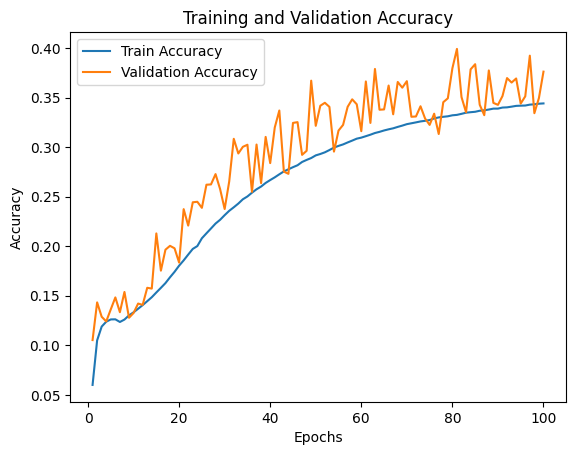

In [30]:
# Plotting the accuracy values
num_epochs=100
epochs = range(1, num_epochs + 1)
plt.plot(epochs, train_accuracy_values, label='Train Accuracy')
plt.plot(epochs, val_accuracy_values, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

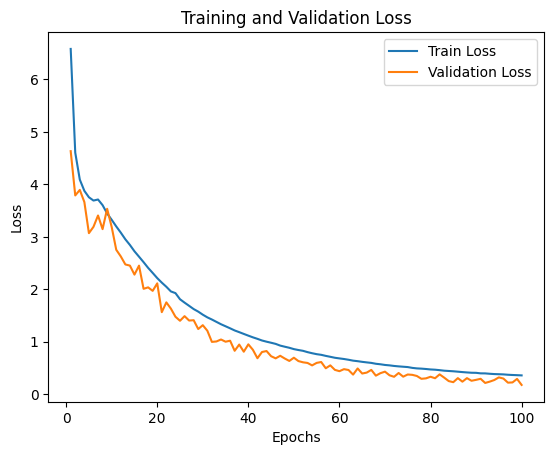

In [31]:
# Plotting the accuracy values
num_epochs=100
epochs = range(1, num_epochs + 1)
plt.plot(epochs, train_loss_values, label='Train Loss')
plt.plot(epochs, val_loss_values, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [32]:
def evaluate(image):
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    start_token = tokenizer.word_index['<start>']
    end_token = tokenizer.word_index['<end>']
    decoder_input = [start_token]
    output = tf.expand_dims(decoder_input, 0) #tokens
    result = [] #word list
    attention_weights_list = []  # List to store attention weights
    for i in range(100):
        dec_mask = create_masks_decoder(output)
        predictions, attention_weights = transformer(img_tensor_val,output,False,dec_mask)
        predictions = predictions[: ,-1:, :]  # (batch_size, 1, vocab_size)
        predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
        if predicted_id == end_token:
            return result,tf.squeeze(output, axis=0), attention_weights_list
        result.append(tokenizer.index_word[int(predicted_id)])
        output = tf.concat([output, predicted_id], axis=-1)
        # Store the attention weights for this step
        attention_weights_list.append(attention_weights)
    return result,tf.squeeze(output, axis=0), attention_weights_list

In [33]:
import matplotlib.colors as mcolors
def plot_attention(image, result, attention_plot):
    len_result = len(result)
    fig = plt.figure(figsize=(10, 10))

    for l in range(len_result):
        if l >= len(attention_plot):
            break
        
        temp_image = np.array(Image.open(image))
        temp_att = np.resize(attention_plot[l]['decoder_layer1_block1'], (8, 8))
        
        # Convert attention map to uint8 data type and apply colormap
        temp_att = (temp_att * 255).astype(np.uint8)
        temp_att = plt.get_cmap('viridis')(temp_att)[:, :, :3]  # Apply colormap (remove alpha channel)
        
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        
        if result[l]:
            ax.set_title(str(result[l]), fontproperties=bangla_font_prop)
        else:
            ax.set_title("No Caption", fontproperties=bangla_font_prop)

        img = ax.imshow(temp_image)
        ax.imshow(temp_att, alpha=0.6, extent=img.get_extent())

    plt.tight_layout()

/kaggle/working/images/2685752892_9d5cd7f274.jpg
BLEU-4 score: 5.255420588163462
BLEU-3 score: 13.904535911329319
BLEU-2 score: 20.51994092236746
BLEU-1 score: 22.616792214653433
Real Caption: साइकलमा सवार एउटा केटा पानीको फोहराको छेउमा छिर्दै छ भने अर्को केटा फोहरामा छ।
Predicted Caption: एक केटा पहेँलो साइकल संग जम्प गर्दै।


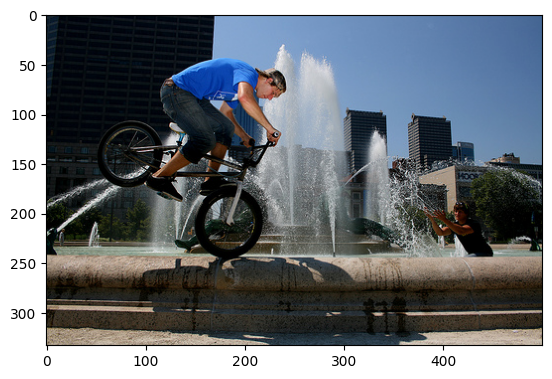

In [34]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3303648823_53cf750acd.jpg
BLEU-4 score: 19.470019576785123
BLEU-3 score: 38.94003915357025
BLEU-2 score: 51.38168970894217
BLEU-1 score: 55.06953149031838
Real Caption: रातो टप र कालो पाइन्टमा हिउँ स्कीयर पहाडबाट तल झर्दै।
Predicted Caption: रातो पाइन्ट लगाएको मान्छे पहाड तल स्की गर्दै।


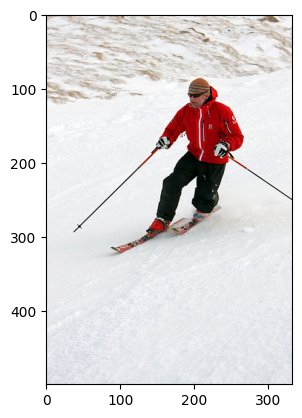

In [35]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2992658871_ac786d37a6.jpg
BLEU-4 score: 27.27272727272727
BLEU-3 score: 23.35496832484569
BLEU-2 score: 21.61497894047949
BLEU-1 score: 27.901593935858266
Real Caption: हरियो शर्ट लगाएको मान्छे रेलिङमा स्केटिंग गर्दैछ।
Predicted Caption: सेतो हेलमेट र हरियो शर्ट लगाएको मानिस आफ्नो रोलरब्लेडमा पिसिरहेको छ।


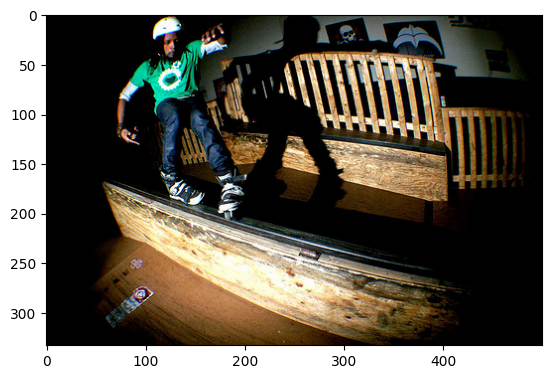

In [36]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3234890865_bb3c316968.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: स्केट पार्कमा रोलरब्लेडिङ गर्दै गरेको मान्छे।
Predicted Caption: एक स्केटबोर्डर भित्तिचित्र ढाकिएको स्केटबोर्ड र्याम्पमा हावामा हाम फाल्दै।


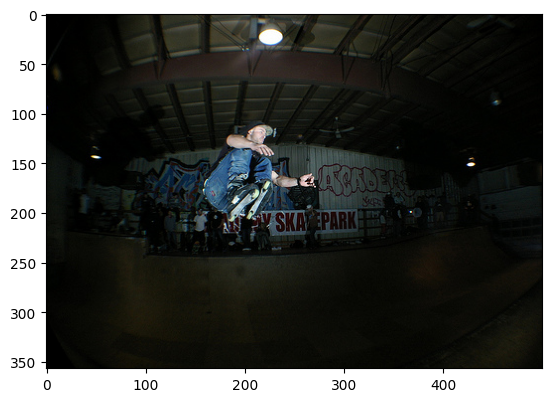

In [37]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2687229880_97cfd8148e.jpg
BLEU-4 score: 25.0
BLEU-3 score: 50.0
BLEU-2 score: 65.9753955386447
BLEU-1 score: 70.71067811865476
Real Caption: कालो पहिरनमा श्यामला महिला धमिलो भीडमा हिंड्दै।
Predicted Caption: कालो शर्ट लगाएकी एउटी महिला घाँसे खेलिरहेकी छिन्।


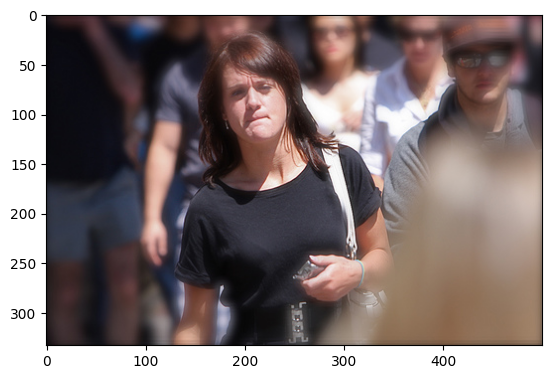

In [38]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3457364788_3514a52091.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: मानिसले एउटी केटीलाई काँधमा सुँगुर बोकेको छ।
Predicted Caption: एक एसियाली केटा र एक एसियाली मानिसको अनुहारमा सवार छन्।


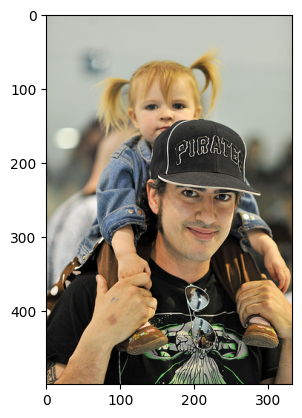

In [39]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3234890865_bb3c316968.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: स्केट पार्कमा रोलरब्लेडिङ गर्दै गरेको मान्छे।
Predicted Caption: एक स्केटबोर्डर भित्तिचित्र ढाकिएको स्केटबोर्ड र्याम्पमा हावामा हाम फाल्दै।


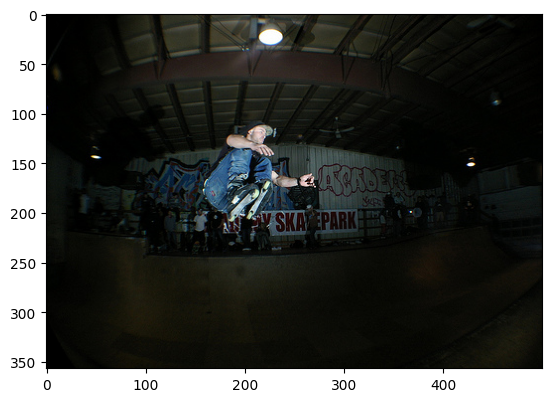

In [40]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/735787579_617b047319.jpg
BLEU-4 score: 50.0
BLEU-3 score: 42.640143271122085
BLEU-2 score: 41.78568918931313
BLEU-1 score: 33.18077402843942
Real Caption: रातो शर्ट लगाएको एउटा सानो केटा पिनाटामा झुलिरहेको छ।
Predicted Caption: सुन्तला कलर भएको शर्ट लगाएको एउटा सानो केटा बेसबलको ब्याट घुमिरहेको छ।


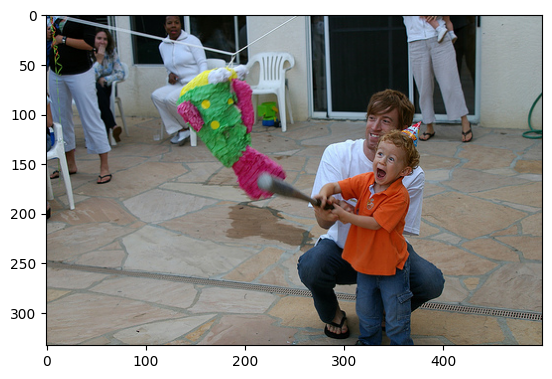

In [41]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3375843443_8d9b242aa5.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: एक पुरुष स्केटबोर्डरले <unk> पाइपको <unk> लिन्छ।
Predicted Caption: स्केटबोर्डर र्‍याम्पमा हावामा उच्च ट्रिक प्रदर्शन गर्दै।


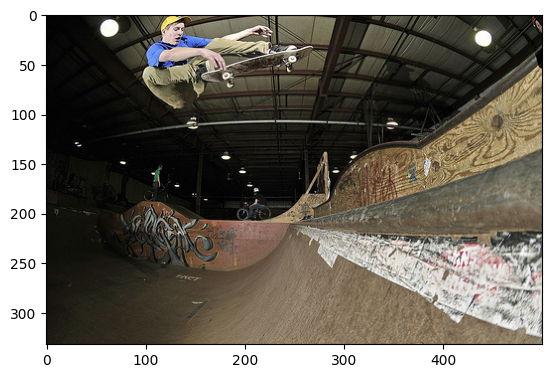

In [42]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2478929971_9eb6c074b6.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: केटा र केटीहरूको एउटा समूह रूखमुनि बसेर कुरा गर्दै
Predicted Caption: छायामा सामाजिकता गरिरहेका किशोरहरू।


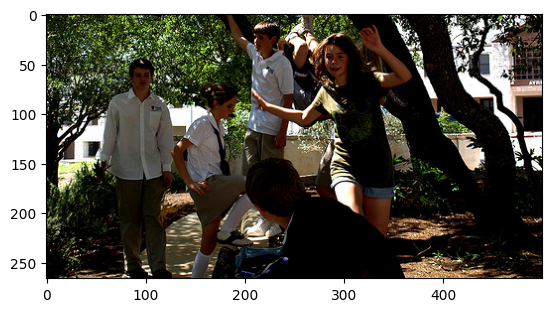

In [43]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3425685827_03683e8e5a.jpg
BLEU-4 score: 10.735389901075512
BLEU-3 score: 28.4031719055601
BLEU-2 score: 41.916638802381996
BLEU-1 score: 46.1999336994571
Real Caption: युवाहरू गुलाबी फूलहरू भएको बाङ्गो रूखको छेउमा घाँसमा बस्छन्।
Predicted Caption: मान्छेहरू फूलका रूखहरू मुनि पार्कमा बच्चा बस्छन्।


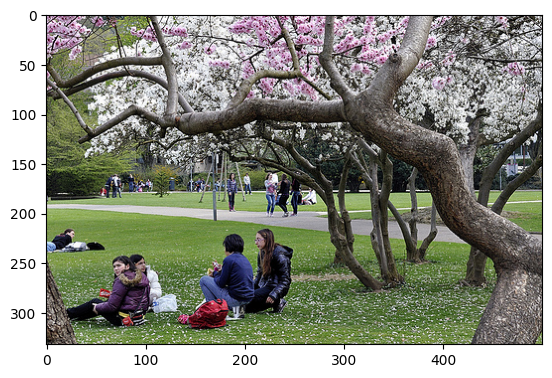

In [44]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3535284878_f90f10236e.jpg
BLEU-4 score: 24.202205228903967
BLEU-3 score: 15.092726661824571
BLEU-2 score: 25.585464971121695
BLEU-1 score: 29.194410863112157
Real Caption: कालो छातीको टुक्रा भएको सेतो कुकुर <unk> समुद्र तटको किनारमा दौडन्छ।
Predicted Caption: एउटा सेतो कुकुर समुद्र तटमा दौडिरहेको छ।


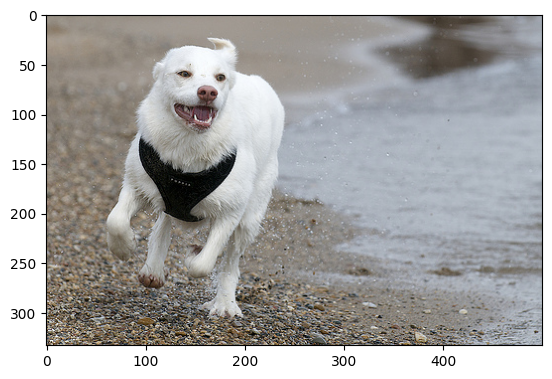

In [45]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3621652774_fd9634bd5b.jpg
BLEU-4 score: 10.735389901075512
BLEU-3 score: 28.4031719055601
BLEU-2 score: 41.916638802381996
BLEU-1 score: 46.1999336994571
Real Caption: एउटा सानो बच्चाले उथले पोखरीमा बस्दा पानीका थोपाहरू समात्छ।
Predicted Caption: एउटा भिजेको केटा पोखरीको पानीमा बसिरहेको छ।


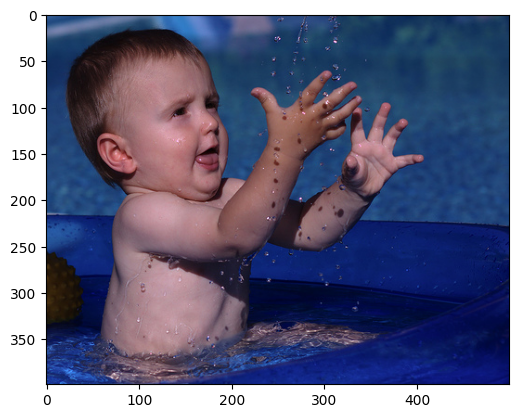

In [46]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2501595799_6316001e89.jpg
BLEU-4 score: 40.0
BLEU-3 score: 29.81423969999719
BLEU-2 score: 25.92550634024553
BLEU-1 score: 32.46679154750989
Real Caption: एउटा सानो केटा बाहिरी किडी पूलमा हाम फाल्दै छ
Predicted Caption: रातो ट्रंक लगाएको एउटा सानो केटा किडी पोखरीमा खेल्दै छ।


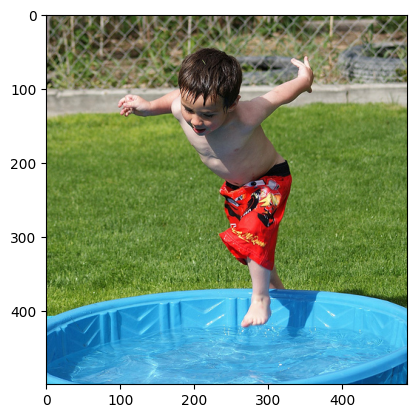

In [47]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3033668641_5905f73990.jpg
BLEU-4 score: 50.0
BLEU-3 score: 33.33333333333333
BLEU-2 score: 27.720448401281438
BLEU-1 score: 34.32945239845196
Real Caption: सेतो हेलमेट लगाएको एउटा मानिस चट्टानको अनुहारमा टाँसिएको छ
Predicted Caption: सेतो हेलमेट लगाएको मान्छे रूखको परेको चट्टानको पर्खालमा टाँसिएको छ।


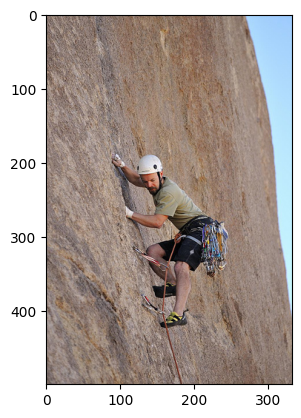

In [48]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2970067128_8842ab3603.jpg
BLEU-4 score: 18.181818181818183
BLEU-3 score: 42.640143271122085
BLEU-2 score: 59.964082520504526
BLEU-1 score: 65.29942057256105
Real Caption: bmx बाइकमा एक व्यक्ति बेन्चमा उफ्रदै।
Predicted Caption: एक bmx राइडरले आफ्नो बाइक भित्तिचित्र ढाकिएको र्याम्पबाट हाम फालेको छ।


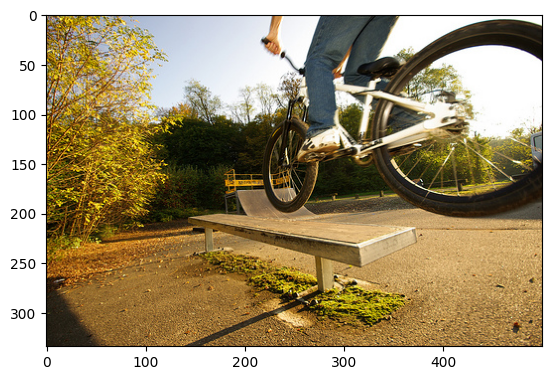

In [49]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2352414953_10f3cd0f1f.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: नीलो शर्ट लगाएको बच्चा उसको हातमा के छ भनेर मुस्कुराउँछ।
Predicted Caption: फोहोर अनुहार भएको जवान केटाले आफ्नो औंलाहरू अनुहार बनाउँछ।


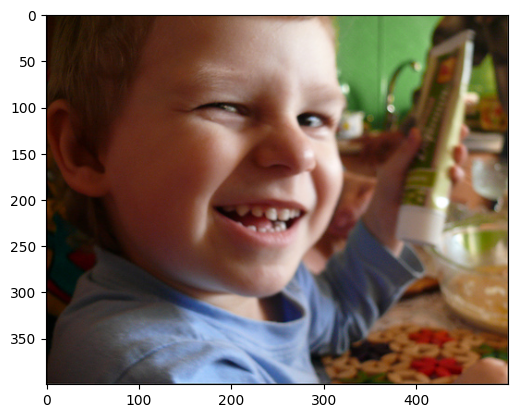

In [50]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/263233914_d25004e4cd.jpg
BLEU-4 score: 22.22222222222222
BLEU-3 score: 47.14045207910317
BLEU-2 score: 63.684866956664344
BLEU-1 score: 68.65890479690393
Real Caption: पोखरीमा उभिरहेकी केटी
Predicted Caption: गुलाबी नुहाउने सूटमा एउटी सानी केटी पोखरीमा हाँसेकी छिन्।


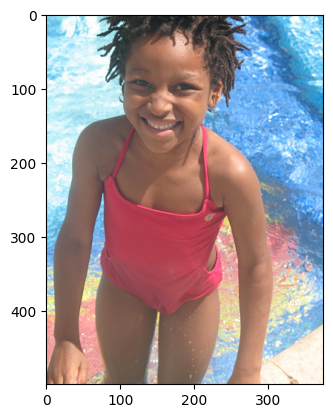

In [51]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2380765956_6313d8cae3.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: पार्कमा एउटी केटी <unk> बजाउँदै मैदानमा बार लगाएर हिँड्दै।
Predicted Caption: नीलो टप र नीलो जिन्स लगाएको व्यक्ति गर्दै।


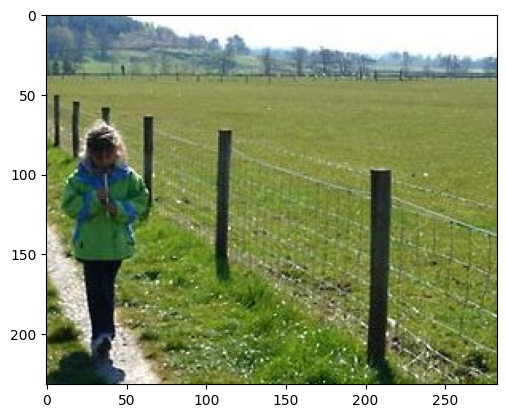

In [52]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/488196964_49159f11fd.jpg
BLEU-4 score: 8.556951983876534
BLEU-3 score: 20.960166113993736
BLEU-2 score: 29.99334964395513
BLEU-1 score: 32.80443278078623
Real Caption: एउटा कुकुरले समुद्री शैवालले ढाकिएको चट्टानमा पहेंलो डोरी बोकेको छ।
Predicted Caption: पानीको शरीरको छेउमा एउटा खैरो कुकुर।


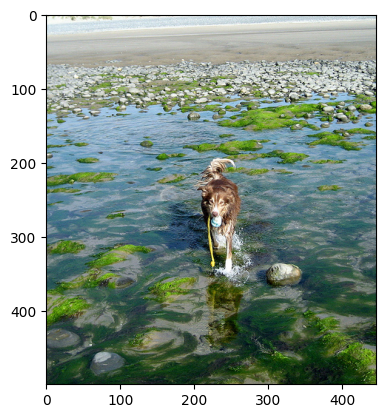

In [53]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/1466307485_5e6743332e.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: सेफ्टी भेस्ट लगाएको एक व्यक्ति ट्रकलाई धकेल्दै।
Predicted Caption: एउटा घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे घाँसे


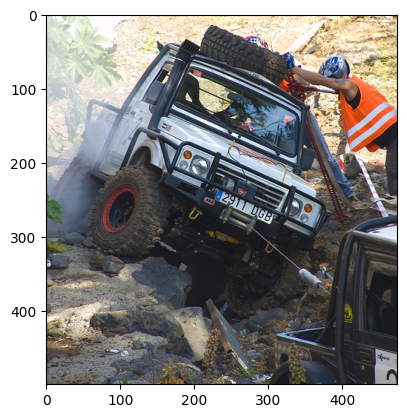

In [54]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3348785391_c243faf6bb.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: पुरुषहरू टाइट्रोपमा खाली खुट्टा हिंडिरहेका छन्।
Predicted Caption: एक स्केटबोर्डरले घाँसको बीचमा हावामा पल्टिरहेको बेला अर्को केटाले हात हावामा समात्छन्।


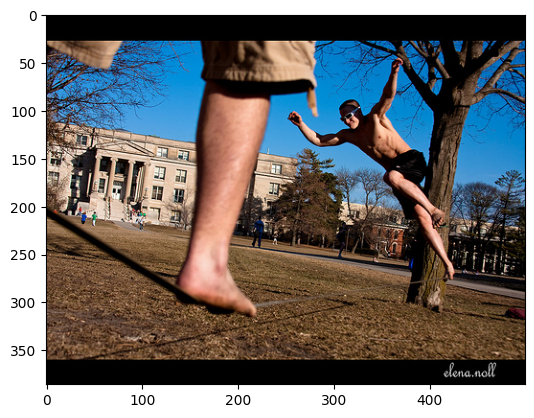

In [55]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/256292144_b53aadae27.jpg
BLEU-4 score: 35.826565528689464
BLEU-3 score: 50.66641486392106
BLEU-2 score: 58.20042740778344
BLEU-1 score: 60.25286104785453
Real Caption: एउटा खैरो र सेतो कुकुर घाँसमा दौडिरहेको छ।
Predicted Caption: एउटा पहेंलो कुकुर खेतमा दौडिरहेको छ


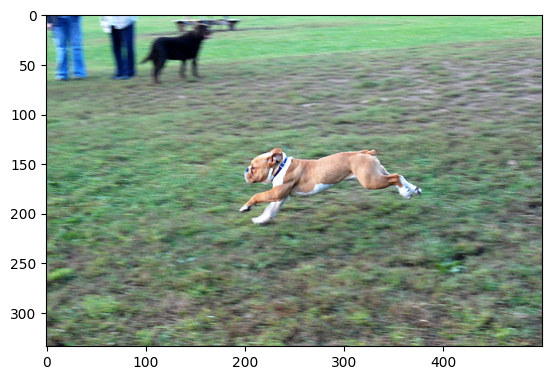

In [56]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2281075738_230892b241.jpg
BLEU-4 score: 6.993452279385044
BLEU-3 score: 18.502935537050632
BLEU-2 score: 27.306135676293408
BLEU-1 score: 30.096441267171585
Real Caption: भर्खरै हिउँ परेको सडक नजिकैको घाँसमा एउटा कालो कुकुरले अर्कोलाई खेदेको छ।
Predicted Caption: दुई कालो कुकुर घाँसे मैदानमा दौडिरहेका छन्।


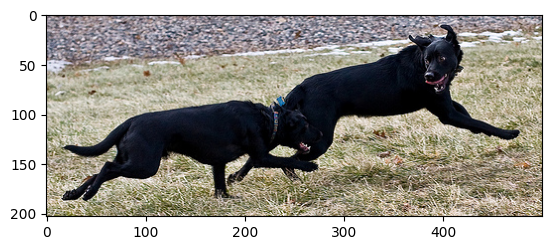

In [57]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3455898176_f0e003ce58.jpg
BLEU-4 score: 50.0
BLEU-3 score: 40.8248290463863
BLEU-2 score: 58.419068106786554
BLEU-1 score: 63.89431042462724
Real Caption: ब्राउन कुकुर बाधामाथि उफ्रिदै।
Predicted Caption: एउटा कुकुर बाधामाथि उफ्रिन्छ।


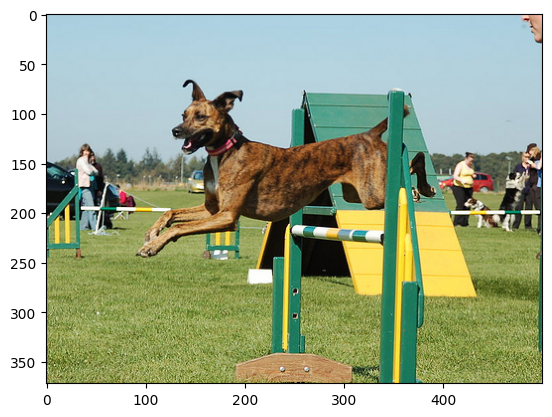

In [58]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2111360187_d2505437b7.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: साबुनको बुलबुलेले छोपेका तीन बालबालिका मुस्कुराउँदै।
Predicted Caption: हरियो पानी वर्दी र अरूले पानीको पन्जा भएका बच्चाहरू मुस्कुराउँदै छन्।


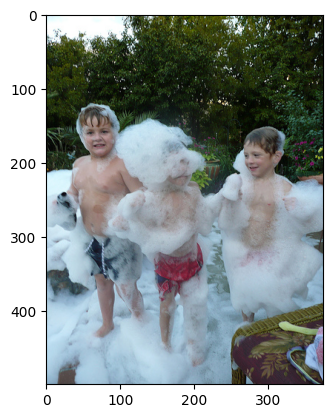

In [59]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2238019823_79318d1f11.jpg
BLEU-4 score: 22.062422564614888
BLEU-3 score: 44.124845129229776
BLEU-2 score: 58.223082209647494
BLEU-1 score: 62.401954419369154
Real Caption: एक मानिस कुहिरो दिनमा गोल्डेन गेट ब्रिजबाट सर्फ गर्दै।
Predicted Caption: एक सर्फर रातो पुल मुनि छालमा सवारी गर्दै।


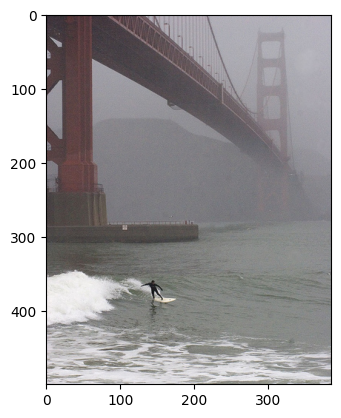

In [60]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3583516290_1c87a13770.jpg
BLEU-4 score: 1.0000000000000004
BLEU-3 score: 10.000000000000002
BLEU-2 score: 25.118864315095806
BLEU-1 score: 31.6227766016838
Real Caption: उत्सवको पोशाक लगाएका मानिसहरूको समूह भवन बाहिर जम्मा भएको छ।
Predicted Caption: पहेँलो र नीलो पहिरन लगाएका छ जना महिला रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको रातो कारको


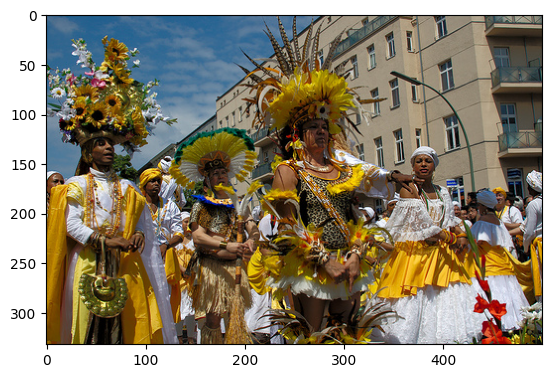

In [61]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/488196964_49159f11fd.jpg
BLEU-4 score: 8.556951983876534
BLEU-3 score: 20.960166113993736
BLEU-2 score: 29.99334964395513
BLEU-1 score: 32.80443278078623
Real Caption: एउटा कुकुरले समुद्री शैवालले ढाकिएको चट्टानमा पहेंलो डोरी बोकेको छ।
Predicted Caption: पानीको शरीरको छेउमा एउटा खैरो कुकुर।


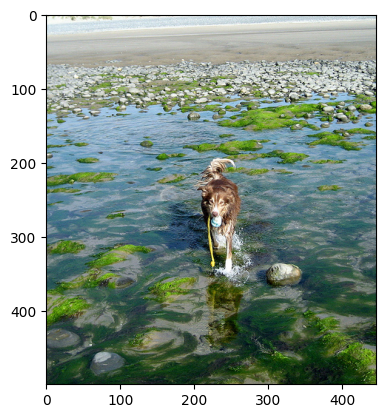

In [62]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3543600125_223747ef4c.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: कालो पहिरनमा एउटी महिला कफी पसलमा चश्मा लगाएको मान्छेको छेउमा बसिरहेकी छिन्।
Predicted Caption: एकजना पुरुष र केटी बसेर रक्सी खाइरहेका छन्।


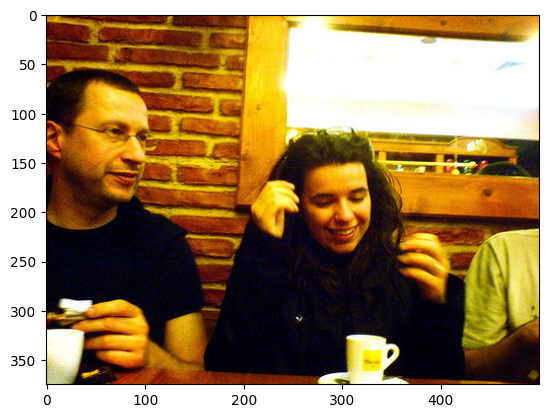

In [63]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3324375078_9441f72898.jpg
BLEU-4 score: 23.88437701912631
BLEU-3 score: 41.36895450425725
BLEU-2 score: 51.534586565499986
BLEU-1 score: 54.44460596606694
Real Caption: तीनवटा कुकुर हिउँमा छन्।
Predicted Caption: हिउँमा खेलिरहेका कुकुरहरू


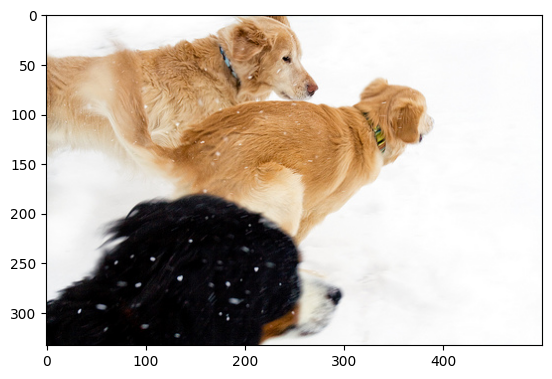

In [64]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3623650392_7b75d4de21.jpg
BLEU-4 score: 28.57142857142857
BLEU-3 score: 53.45224838248488
BLEU-2 score: 68.67198272427282
BLEU-1 score: 73.11104457090248
Real Caption: खेतमा एउटा खैरो कुकुर।
Predicted Caption: एउटा ठूलो खैरो कुकुरले आफ्नो टाउको हल्लाउँदै।


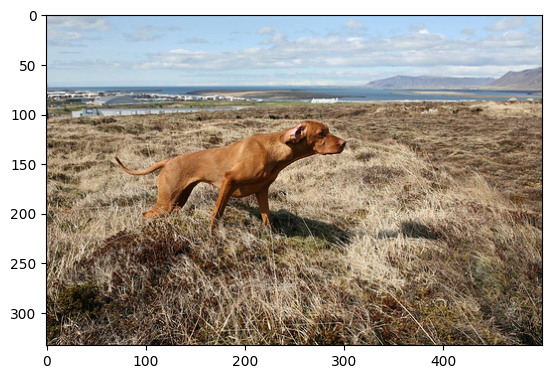

In [65]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

In [66]:
!pip install pycocoevalcap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.8/427.8 kB 25.9 MB/s eta 0:00:00


In [67]:
from pycocoevalcap.meteor.meteor import Meteor

In [68]:
import nltk
from nltk.util import ngrams
import numpy as np
from pycocoevalcap.meteor.meteor import Meteor

# Initialize METEOR scorer
meteor_scorer = Meteor()

def calculate_meteor(reference, candidate):
    ref_dict = {0: [reference]}  # Wrap reference in a list of lists
    cand_dict = {0: [candidate]}  # Wrap candidate in a list of lists
    _, score = meteor_scorer.compute_score(ref_dict, cand_dict)
    return score[0]  # Extract the score from the list

data_ref = []
data_gen = []
meteor_scores = []
cnt = 0

for j in range(len(img_name_val)):
    image = img_name_val[j]
    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[j] if i not in [0]])
    caption, result, attention_plot = evaluate(image)

    # Preprocess captions
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    # Remove unknown tokens
    caption = [i for i in caption if i != "<unk>"]
    real_caption = [i for i in real_caption.split() if i != "<unk>"]

    # Compute METEOR score
    meteor = calculate_meteor(' '.join(real_caption), ' '.join(caption))
    
    if meteor >= 0.5:  
        meteor_scores.append(meteor)
        cnt += 1

        # Handle repetition in the generated caption
        caption = [w for i, w in enumerate(caption) if i == 0 or w != caption[i - 1]]

        # Truncate if the caption is too long
        max_length = 25
        if len(caption) > max_length or len(real_caption) > max_length:
            continue

        # Convert lists to strings
        reference = ' '.join(real_caption)
        candidate = ' '.join(caption)

        data_ref.append(reference)
        data_gen.append(candidate)

if cnt > 0:
    avg_meteor = sum(meteor_scores) / cnt
else:
    avg_meteor = 0

print(f"Average METEOR score: {avg_meteor:.4f}")

# Write data to text files
file_name1 = "convt_reference.txt"
with open(file_name1, "w") as file:
    for item in data_ref:
        file.write(item + "\n")
print(f"Data from the list written to {file_name1} successfully.")

file_name2 = "convt_candidate.txt"
with open(file_name2, "w") as file:
    for item in data_gen:
        file.write(item + "\n")
print(f"Data from the list written to {file_name2} successfully.")

Average METEOR score: 0.6057
Data from the list written to convt_reference.txt successfully.
Data from the list written to convt_candidate.txt successfully.
